In [1]:
import pandas as pd
import plotly.express as px
import geopandas as gpd
import folium
import random
from matplotlib.colors import to_hex
from matplotlib import colormaps

In [2]:
# Carica i file
df = pd.read_csv("worldcups.csv")
df_countries = pd.read_csv("countries.csv")

## Total World Cups by country (1930 - 2022)

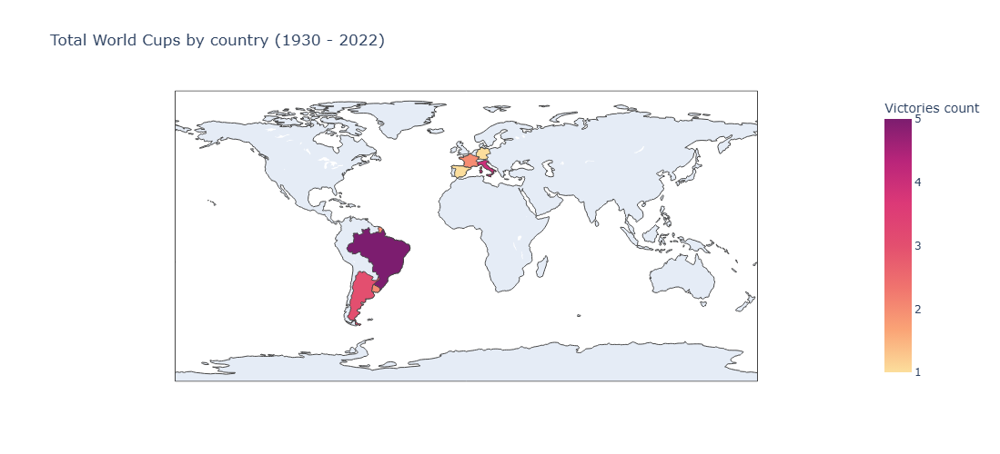

In [3]:
#Conta le vittorie per nazione
wins = df['winner'].value_counts().reset_index()
wins.columns = ['country', 'wins']

# Pulizia nomi e normalizzazione
wins['country_clean'] = wins['country'].str.strip().str.lower()
df_countries['name_clean'] = df_countries['English short name'].str.strip().str.lower()

# 4. Merge per ottenere il codice ISO3
merged = pd.merge(wins, df_countries, left_on='country_clean', right_on='name_clean', how='left')
merged = merged.dropna(subset=['Alpha-3 code'])  # rimuove nazioni non mappate

# 5. Rinominare per compatibilità con Plotly
merged['iso_alpha'] = merged['Alpha-3 code']
merged['country'] = merged['country']  # per hover_name

# 6. Crea la mappa
fig = px.choropleth(
    merged,
    locations='iso_alpha',
    color='wins',
    hover_name='country',
    color_continuous_scale='sunsetdark',
    height=500,
    width=900,
    title='Total World Cups by country (1930 - 2022)',
    labels={'wins': 'Victories count'}
)

fig.show()


In [5]:
df['host_list'] = df['host'].str.split(r',\s*') #espandiamo i paesi ospitanti (serve per "Japan and south Korea)
df_expanded = df.explode('host_list') #tutti i paesi su righe separate
df_expanded['host_clean'] = df_expanded['host_list'].str.strip().str.lower()
df_countries['name_clean'] = df_countries['English short name'].str.strip().str.lower()

#Correggiamo i nomi problematici
fixes = {
    'usa': 'united states of america',
    'south korea': 'korea, republic of (south korea)'
}
df_expanded['host_clean'] = df_expanded['host_clean'].replace(fixes)

#Merge tra host e codici ISO
merged = pd.merge(df_expanded, df_countries, left_on='host_clean', right_on='name_clean', how='left')
host_df = merged[['host_list', 'Alpha-3 code']].dropna().drop_duplicates()
host_df.columns = ['country', 'iso3']

#Carica geometrie dei paesi
world = gpd.read_file("data/ne_10m_admin_0_countries.shp")

#Merge geometrie con i paesi ospitanti
host_geo = world.merge(host_df, left_on='ADM0_A3', right_on='iso3', how='inner')

#Assegna un colore diverso per ogni paese
unique_countries = host_geo['country'].unique()
cmap = colormaps['Dark2']
color_map = {country: to_hex(cmap(i / len(unique_countries))) for i, country in enumerate(unique_countries)}
host_geo['color'] = host_geo['country'].map(color_map)

#Creazione della mappa
m = folium.Map(location=[20, 0], zoom_start=2)

#Coloriamo i paesi ospitanti
for _, row in host_geo.iterrows():
    geo_json = gpd.GeoSeries(row['geometry']).simplify(0.01).to_json()
    folium.GeoJson(
        geo_json,
        style_function=lambda feature, color=row['color']: {
            'fillColor': color,
            'color': 'none',
            'weight': 0,
            'fillOpacity': 0.7,
        },
        tooltip=folium.Tooltip(row['country'])
    ).add_to(m)
m